In [1]:
import os
import sys
import datetime
import random
from typing import List

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling


In [2]:
random.seed(0)
%matplotlib inline
sys.path.append('../utils/')

In [3]:
from content_based_recomender import ContentBasedRecommender
from baseline_last_sold_recommender import LastSoldRecommender
from baseline_most_sold_recommender import MostSoldRecommender

# Load data

In [4]:
for dirname, _, filenames in os.walk('./../data'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


./../data/Customer.csv
./../data/prod_cat_info.csv
./../data/Transactions.csv


In [5]:
customer_raw_df = pd.read_csv('./../data/Customer.csv')
prod_cat_info_raw_df = pd.read_csv('./../data/prod_cat_info.csv')
transactions_raw_df = pd.read_csv('./../data/Transactions.csv')


# Customer info

In [6]:
print(customer_raw_df.shape)
customer_raw_df.head()

(5647, 4)


,customer_Id,DOB,Gender,city_code
0,268408,02-01-1970,M,4.0
1,269696,07-01-1970,F,8.0
2,268159,08-01-1970,F,8.0
3,270181,10-01-1970,F,2.0
4,268073,11-01-1970,M,1.0


In [7]:
customer_raw_df.nunique()

customer_Id    5647
DOB            4056
Gender            2
city_code        10
dtype: int64

5647 unique customer, from 10 different cities

In [8]:
pandas_profiling.ProfileReport(customer_raw_df)

Les codes de villes sont uniformement distribué, le sexe aussi.


In [9]:
customer_raw_df.isnull().sum()

customer_Id    0
DOB            0
Gender         2
city_code      2
dtype: int64

In [10]:
customer_raw_df[customer_raw_df.Gender.isnull()]

,customer_Id,DOB,Gender,city_code
24,267199,14-02-1970,NaN,2.0
87,271626,02-06-1970,NaN,6.0


In [11]:
customer_raw_df[customer_raw_df.city_code.isnull()]

,customer_Id,DOB,Gender,city_code
115,268447,14-07-1970,M,NaN
149,268709,09-09-1970,F,NaN


Deux valeurs nulles pour "gender" et "city code"

In [12]:
customer_raw_df['age_at_start_of_recods'] = (pd.to_datetime('01-01-2011', format='%d-%m-%Y')-pd.to_datetime(customer_raw_df.DOB, format='%d-%m-%Y')).map(lambda x:x.days)//365
customer_raw_df

,customer_Id,DOB,Gender,city_code,age_at_start_of_recods
0,268408,02-01-1970,M,4.0,41
1,269696,07-01-1970,F,8.0,41
2,268159,08-01-1970,F,8.0,41
3,270181,10-01-1970,F,2.0,41
4,268073,11-01-1970,M,1.0,41
...,...,...,...,...,...
5642,274474,19-12-1992,M,2.0,18
5643,267666,24-12-1992,M,6.0,18
5644,270476,25-12-1992,F,3.0,18
5645,269626,27-12-1992,F,5.0,18


In [13]:
customer_raw_df.age_at_start_of_recods.describe()

count    5647.000000
mean       28.961573
std         6.619199
min        18.000000
25%        23.000000
50%        29.000000
75%        35.000000
max        41.000000
Name: age_at_start_of_recods, dtype: float64

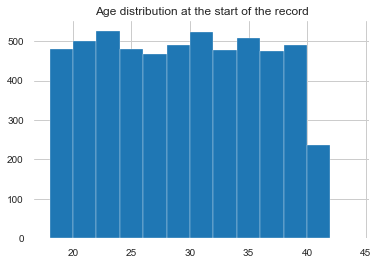

In [14]:
customer_raw_df.age_at_start_of_recods.hist(bins=[18+i*2 for i in range(25) if 18+i*2<45])
plt.title('Age distribution at the start of the record')
plt.show()

L'age aussi est uniformement distribué

# Product category

In [15]:
print(prod_cat_info_raw_df.shape)
prod_cat_info_raw_df

(23, 4)


,prod_cat_code,prod_cat,prod_sub_cat_code,prod_subcat
0,1,Clothing,4,Mens
1,1,Clothing,1,Women
2,1,Clothing,3,Kids
3,2,Footwear,1,Mens
4,2,Footwear,3,Women
5,2,Footwear,4,Kids
6,3,Electronics,4,Mobiles
7,3,Electronics,5,Computers
8,3,Electronics,8,Personal Appliances
9,3,Electronics,9,Cameras


In [16]:
prod_cat_info_raw_df.nunique()

prod_cat_code         6
prod_cat              6
prod_sub_cat_code    12
prod_subcat          18
dtype: int64

23 unique combinaisons de catégoried et sous-catégories

In [17]:
pandas_profiling.ProfileReport(prod_cat_info_raw_df)

Les codes de villes sont uniformement distribué, le sexe aussi.


In [18]:
prod_cat_info_raw_df

,prod_cat_code,prod_cat,prod_sub_cat_code,prod_subcat
0,1,Clothing,4,Mens
1,1,Clothing,1,Women
2,1,Clothing,3,Kids
3,2,Footwear,1,Mens
4,2,Footwear,3,Women
5,2,Footwear,4,Kids
6,3,Electronics,4,Mobiles
7,3,Electronics,5,Computers
8,3,Electronics,8,Personal Appliances
9,3,Electronics,9,Cameras


Remarque: les sous-catégories n'ont pas les même code au sein de chaque catégorie

# Transactions info

In [19]:
transactions_raw_df

,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type
0,80712190438,270351,28-02-2014,1,1,-5,-772,405.300,-4265.300,e-Shop
1,29258453508,270384,27-02-2014,5,3,-5,-1497,785.925,-8270.925,e-Shop
2,51750724947,273420,24-02-2014,6,5,-2,-791,166.110,-1748.110,TeleShop
3,93274880719,271509,24-02-2014,11,6,-3,-1363,429.345,-4518.345,e-Shop
4,51750724947,273420,23-02-2014,6,5,-2,-791,166.110,-1748.110,TeleShop
...,...,...,...,...,...,...,...,...,...,...
23048,94340757522,274550,25-01-2011,12,5,1,1264,132.720,1396.720,e-Shop
23049,89780862956,270022,25-01-2011,4,1,1,677,71.085,748.085,e-Shop
23050,85115299378,271020,25-01-2011,2,6,4,1052,441.840,4649.840,MBR
23051,72870271171,270911,25-01-2011,11,5,3,1142,359.730,3785.730,TeleShop


In [20]:
print(transactions_raw_df.shape)
transactions_raw_df['tran_date'] = pd.to_datetime(transactions_raw_df['tran_date'].str.replace('/','-'), format='%d-%m-%Y')
transactions_raw_df.head()

(23053, 10)


,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type
0,80712190438,270351,2014-02-28,1,1,-5,-772,405.300,-4265.300,e-Shop
1,29258453508,270384,2014-02-27,5,3,-5,-1497,785.925,-8270.925,e-Shop
2,51750724947,273420,2014-02-24,6,5,-2,-791,166.110,-1748.110,TeleShop
3,93274880719,271509,2014-02-24,11,6,-3,-1363,429.345,-4518.345,e-Shop
4,51750724947,273420,2014-02-23,6,5,-2,-791,166.110,-1748.110,TeleShop


In [21]:
transactions_raw_df

,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type
0,80712190438,270351,2014-02-28,1,1,-5,-772,405.300,-4265.300,e-Shop
1,29258453508,270384,2014-02-27,5,3,-5,-1497,785.925,-8270.925,e-Shop
2,51750724947,273420,2014-02-24,6,5,-2,-791,166.110,-1748.110,TeleShop
3,93274880719,271509,2014-02-24,11,6,-3,-1363,429.345,-4518.345,e-Shop
4,51750724947,273420,2014-02-23,6,5,-2,-791,166.110,-1748.110,TeleShop
...,...,...,...,...,...,...,...,...,...,...
23048,94340757522,274550,2011-01-25,12,5,1,1264,132.720,1396.720,e-Shop
23049,89780862956,270022,2011-01-25,4,1,1,677,71.085,748.085,e-Shop
23050,85115299378,271020,2011-01-25,2,6,4,1052,441.840,4649.840,MBR
23051,72870271171,270911,2011-01-25,11,5,3,1142,359.730,3785.730,TeleShop


total_amt = Rate*Qty+Tax

In [22]:
transactions_raw_df.nunique()

transaction_id      20878
cust_id              5506
tran_date            1129
prod_subcat_code       12
prod_cat_code           6
Qty                    10
Rate                 2551
Tax                  4194
total_amt            5764
Store_type              4
dtype: int64

5647 unique customer, from 10 different cities

In [23]:
pandas_profiling.ProfileReport(transactions_raw_df)

Les codes de villes sont uniformement distribué, le sexe aussi.


In [24]:
transactions_raw_df.isnull().sum()

transaction_id      0
cust_id             0
tran_date           0
prod_subcat_code    0
prod_cat_code       0
Qty                 0
Rate                0
Tax                 0
total_amt           0
Store_type          0
dtype: int64

à partir de l'année 2014 la distribution devient bizarre sur transaction date

In [25]:
transactions_raw_df[transactions_raw_df.total_amt<0]

,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type
0,80712190438,270351,2014-02-28,1,1,-5,-772,405.300,-4265.300,e-Shop
1,29258453508,270384,2014-02-27,5,3,-5,-1497,785.925,-8270.925,e-Shop
2,51750724947,273420,2014-02-24,6,5,-2,-791,166.110,-1748.110,TeleShop
3,93274880719,271509,2014-02-24,11,6,-3,-1363,429.345,-4518.345,e-Shop
4,51750724947,273420,2014-02-23,6,5,-2,-791,166.110,-1748.110,TeleShop
...,...,...,...,...,...,...,...,...,...,...
22919,42161597232,267094,2011-01-31,3,1,-3,-147,46.305,-487.305,MBR
22926,72870271171,270911,2011-01-31,11,5,-3,-1142,359.730,-3785.730,TeleShop
22929,90114483354,268097,2011-01-31,10,5,-4,-1408,591.360,-6223.360,e-Shop
22977,99568595128,273973,2011-01-29,4,2,-3,-203,63.945,-672.945,e-Shop


In [26]:
pandas_profiling.ProfileReport(transactions_raw_df[transactions_raw_df.total_amt<0])

On va considérer les valeurs négatives comme retour

In [27]:
transactions_df = transactions_raw_df.copy()
transactions_df = transactions_df[transactions_df.Qty>0]
transactions_df['item_id']=transactions_df.prod_cat_code.astype(str)+'_'+transactions_df.prod_subcat_code.astype(str)
transactions_df = transactions_df[['transaction_id', 'cust_id', 'item_id', 'tran_date', 'Qty']]
transactions_df

,transaction_id,cust_id,item_id,tran_date,Qty
10,29258453508,270384,3_5,2014-02-20,5
11,25455265351,267750,6_12,2014-02-20,3
12,1571002198,275023,5_6,2014-02-20,4
14,36554696014,269345,5_3,2014-02-20,3
15,56814940239,268799,5_7,2014-02-20,5
...,...,...,...,...,...
23048,94340757522,274550,5_12,2011-01-25,1
23049,89780862956,270022,1_4,2011-01-25,1
23050,85115299378,271020,6_2,2011-01-25,4
23051,72870271171,270911,5_11,2011-01-25,3


In [28]:
transactions_df_analysis = transactions_df.copy()

In [29]:
transactions_df_analysis['month_year']=transactions_df_analysis.tran_date.astype(str).map(lambda x:x[:7])


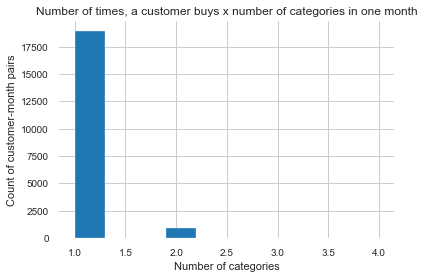

In [30]:
transactions_df_analysis.groupby(['cust_id','month_year'])['transaction_id'].count().hist()
plt.title('Number of times, a customer buys x number of categories in one month')
plt.xlabel('Number of categories')
plt.ylabel('Count of customer-month pairs')
plt.show()

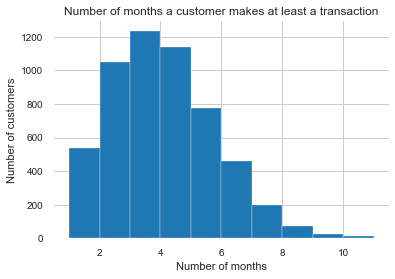

In [31]:
transactions_df_analysis.groupby('cust_id')['month_year'].nunique().hist()
plt.title('Number of months a customer makes at least a transaction')
plt.xlabel('Number of months')
plt.ylabel('Number of customers')
plt.show()

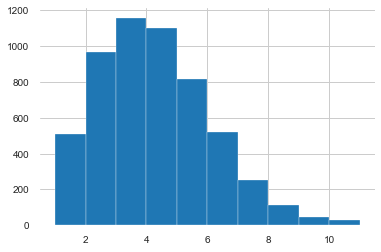

In [32]:
transactions_df_analysis.groupby('cust_id')['month_year'].count().hist()

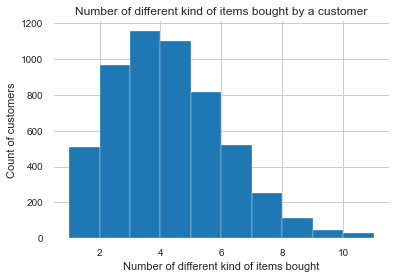

In [33]:
transactions_df.cust_id.value_counts().hist()
plt.title('Number of different kind of items bought by a customer')
plt.xlabel('Number of different kind of items bought')
plt.ylabel('Count of customers')
plt.show()

# Content-based recommendation : formulating the problem

## Items table

L'ID d'un 'item' sera la concaténation de la catégorie et de la sous catégorie

In [34]:
items_df = prod_cat_info_raw_df.copy()
items_df['item_id']=items_df.prod_cat_code.astype(str)+'_'+items_df.prod_sub_cat_code.astype(str)
items_df= items_df[['item_id','prod_cat_code', 'prod_cat', 'prod_sub_cat_code', 'prod_subcat']]
items_df

,item_id,prod_cat_code,prod_cat,prod_sub_cat_code,prod_subcat
0,1_4,1,Clothing,4,Mens
1,1_1,1,Clothing,1,Women
2,1_3,1,Clothing,3,Kids
3,2_1,2,Footwear,1,Mens
4,2_3,2,Footwear,3,Women
5,2_4,2,Footwear,4,Kids
6,3_4,3,Electronics,4,Mobiles
7,3_5,3,Electronics,5,Computers
8,3_8,3,Electronics,8,Personal Appliances
9,3_9,3,Electronics,9,Cameras


In [35]:
items_df[['item_id','prod_cat','prod_subcat']]

,item_id,prod_cat,prod_subcat
0,1_4,Clothing,Mens
1,1_1,Clothing,Women
2,1_3,Clothing,Kids
3,2_1,Footwear,Mens
4,2_3,Footwear,Women
5,2_4,Footwear,Kids
6,3_4,Electronics,Mobiles
7,3_5,Electronics,Computers
8,3_8,Electronics,Personal Appliances
9,3_9,Electronics,Cameras


In [36]:
items_df['dummy_column']=1

prod_cat_features = pd.pivot_table(items_df, index='item_id', columns='prod_cat',values='dummy_column')
prod_subcat_features = pd.pivot_table(items_df, index='item_id', columns='prod_subcat',values='dummy_column')

prod_features = prod_cat_features.join(prod_subcat_features).fillna(0)

items_df.drop(columns=['dummy_column'], inplace=True)


In [37]:
def get_sales_until_date(transactions: pd.DataFrame, max_date:str='01-01-2012')-> pd.DataFrame:
    """
    return the sales data (index: customers, columns: items, quantity sold since day1), 
    an equivalent to recommendation table, until a certain date
    :param transactions: pd.DataFrame, all transactions
    :param max_date: str, maximum date to consider
    :return: pd.DataFrame, sales table (equivalent to recommendation table
    """
    trasaction_until_date = transactions[transactions.tran_date<pd.to_datetime(max_date, format='%d-%m-%Y')]
    trasaction_grouped_by_customer_item = (
        trasaction_until_date.groupby(['cust_id','item_id'])[['Qty']].sum().reset_index()
    )
    sales_table = (
        pd.pivot_table(
            trasaction_grouped_by_customer_item,index='cust_id',columns='item_id',values='Qty'
        ).fillna(0)
    )
    
    # add missing items
    for item_id in transactions.item_id.unique():
        if item_id not in sales_table.columns:
            sales_table[item_id] = 0
    sales_table.columns = sorted(sales_table.columns)
    return sales_table


In [38]:
sales = get_sales_until_date(transactions_df, '01-04-2011')

In [39]:
sales

,1_1,1_3,1_4,2_1,2_3,2_4,3_10,3_4,3_5,3_8,...,5_10,5_11,5_12,5_3,5_6,5_7,6_10,6_11,6_12,6_2
cust_id,,,,,,,,,,,,,,,,,,,,,
266785,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
266794,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
266810,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
266822,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
266829,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275224,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0
275226,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
275227,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Evaluate the model:

We evaluate it on the year 2013 (training on 2011-2012)
We make predictions every month

In [40]:
dates_to_train_on = [f'01-{str(month).zfill(2)}-2013' for month in range(1,13)]+['01-01-2014']

In [41]:
items_ids = items_df.item_id.unique()
def fill_with_other_items_randomly(items_recommended: List) -> List:
    """
    If complete the list of recommended items with the rest of the items at random
    :param items_recommended: list, list of items recommended
    :return: list, ordered list of all the items to be recommended  
    """
    items_not_recommended = [item_id for item_id in items_ids if item_id not in items_recommended]
    # recommend other items randomly 
    random_items_not_recommended = random.sample(items_not_recommended,len(items_not_recommended))
    return items_recommended+random_items_not_recommended

In [42]:
def evaluate_recommendation(items_sold: List[List[str]], items_predicted: List[List[str]]):
    """
    Mean (Size(item |  item in items_sold and item in items_predicted) / Size(item |  item in items_sold) for each user) 
    :param items_sold: array-like, List of users' lists of items sold 
    :param items_predicted: array-like, List of users' lists of recommended items 
    :return:
    """
    return sum([len(set(x) & set(y))/len(x) for x, y in zip(items_sold, items_predicted)])/len(items_sold)

In [43]:
def evaluate_on_n_items(number_of_items_recommended):
    # Make a prediction for each month of the year 2013
    yearly_sold = []
    yearly_cbr_predictions = []
    yearly_lsr_predictions = []
    yearly_msr_predictions = []


    for i, date in enumerate(dates_to_train_on[:-1]):

        cumulative_sales = get_sales_until_date(transactions_df, date)

        cumulative_sales_next_month = get_sales_until_date(transactions_df, dates_to_train_on[i+1])
        sales_next_month = (cumulative_sales_next_month-cumulative_sales).fillna(0)
        total_sales_next_month = sales_next_month.sum(axis=1)
        customers_next_month = total_sales_next_month[total_sales_next_month>0].index.tolist()

        items_sold = sales_next_month.loc[customers_next_month].apply(lambda s : s[s>0].index.tolist(),axis=1)
        yearly_sold.append(items_sold)

        # Content based recommender
        cbr = ContentBasedRecommender(prod_features.columns)
        cbr.fit(cumulative_sales, prod_features)
        predictions = cbr.predict(customers_next_month)
        cbr_predicted_items = (predictions
                               .apply(lambda s : s[s>0].sort_values(ascending=False)[:number_of_items_recommended].index.tolist(),axis=1)
                               .map(fill_with_other_items_randomly).map(lambda x: x[:number_of_items_recommended])
        )
        yearly_cbr_predictions.append(cbr_predicted_items)

        # Last sold recommender 
        transaction_until_current_month = transactions_df[transactions_df.tran_date<pd.to_datetime(date, format='%d-%m-%Y')]
        lsr = LastSoldRecommender()
        lsr.fit(transaction_until_current_month)
        lsr_predicted_items = lsr.predict(customers_next_month).map(fill_with_other_items_randomly).map(lambda x: x[:number_of_items_recommended])
        yearly_lsr_predictions.append(lsr_predicted_items)

        # Most sold recommender 
        msr = MostSoldRecommender()
        msr.fit(cumulative_sales)
        msr_predicted_items = msr.predict(customers_next_month).map(fill_with_other_items_randomly).map(lambda x: x[:number_of_items_recommended])
        yearly_msr_predictions.append(msr_predicted_items)

    yearly_sold = pd.concat(yearly_sold,ignore_index=True)
    yearly_cbr_predictions = pd.concat(yearly_cbr_predictions,ignore_index=True)
    yearly_lsr_predictions = pd.concat(yearly_lsr_predictions,ignore_index=True)
    yearly_msr_predictions = pd.concat(yearly_msr_predictions,ignore_index=True)
    
    print('Score of CBR:', evaluate_recommendation(yearly_sold, yearly_cbr_predictions)*100)
    print('Score of LSR:', evaluate_recommendation(yearly_sold, yearly_lsr_predictions)*100)
    print('Score of MSR:', evaluate_recommendation(yearly_sold, yearly_msr_predictions)*100)


In [44]:
for n in [1,3,5]:
    print(f'Evaluation on {n} predictions')
    evaluate_on_n_items(n)

Evaluation on 1 predictions
Score of CBR: 4.499178981937603
Score of LSR: 4.135194307608101
Score of MSR: 4.729064039408867
Evaluation on 3 predictions
Score of CBR: 13.42911877394636
Score of LSR: 12.914614121510674
Score of MSR: 13.013136288998359
Evaluation on 5 predictions
Score of CBR: 21.376573617952925
Score of LSR: 22.02517788724685
Score of MSR: 22.003284072249592
